In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/happy-whale-and-dolphin/sample_submission.csv
/kaggle/input/happy-whale-and-dolphin/train.csv
/kaggle/input/happy-whale-and-dolphin/train_images/80b5373b87942b.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/e113b51585c677.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/94eb976e25416c.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/19a45862ab99cd.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/be9645065510e9.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/76d25044120d3c.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/0c64a705ba5d31.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/c1fe278bdbd837.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/6f94f30ac500a0.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/15f295322e5b54.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/f3a102d194cf90.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/620f2cf64896e9.jpg
/kaggle/input/happy-whale-and-dolphin/train_images/5

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from warnings import simplefilter
import os

In [3]:
TRAIN_PATH = '../input/happy-whale-and-dolphin/train_images'
TEST_PATH = '../input/happy-whale-and-dolphin/test_images'
df = pd.read_csv('../input/happy-whale-and-dolphin/train.csv')
df.tail()

,image,species,individual_id
51028,fff639a7a78b3f.jpg,beluga,5ac053677ed1
51029,fff8b32daff17e.jpg,cuviers_beaked_whale,1184686361b3
51030,fff94675cc1aef.jpg,blue_whale,5401612696b9
51031,fffbc5dd642d8c.jpg,beluga,4000b3d7c24e
51032,fffdcd42312777.jpg,bottlenose_dolphin,4ddb2eeb5efb


In [4]:
df['image_path'] = df['image'].apply(lambda filename : os.path.join(TRAIN_PATH, filename))
df.head()

,image,species,individual_id,image_path
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9,../input/happy-whale-and-dolphin/train_images/...
1,000562241d384d.jpg,humpback_whale,1a71fbb72250,../input/happy-whale-and-dolphin/train_images/...
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b,../input/happy-whale-and-dolphin/train_images/...
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063,../input/happy-whale-and-dolphin/train_images/...
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392,../input/happy-whale-and-dolphin/train_images/...


In [5]:
print(f"Images in train index file: {df.image.nunique()}")
print(f"Species in train index file: {df.species.nunique()}")
print(f"Individual IDs in train index file: {df.individual_id.nunique()}")

print(f"Images in train images folder: {len(os.listdir(TRAIN_PATH))}")
print(f"Images in test images folder: {len(os.listdir(TEST_PATH))}")

Images in train index file: 51033
Species in train index file: 30
Individual IDs in train index file: 15587
Images in train images folder: 51033
Images in test images folder: 27956


In [6]:
print("Species:   ")
for i in df.species.unique():
    print(i)

Species:   
melon_headed_whale
humpback_whale
false_killer_whale
bottlenose_dolphin
beluga
minke_whale
fin_whale
blue_whale
gray_whale
southern_right_whale
common_dolphin
kiler_whale
pilot_whale
dusky_dolphin
killer_whale
long_finned_pilot_whale
sei_whale
spinner_dolphin
bottlenose_dolpin
cuviers_beaked_whale
spotted_dolphin
globis
brydes_whale
commersons_dolphin
white_sided_dolphin
short_finned_pilot_whale
rough_toothed_dolphin
pantropic_spotted_dolphin
pygmy_killer_whale
frasiers_dolphin


In [7]:
# beluga and globis are also whale species hence changing there name

df.loc[df.species.str.contains('beluga'), 'species'] = 'beluga_whale'
df.loc[df.species.str.contains('globis'), 'species'] = 'globis_whale'

In [8]:
# fix spelling errors
df['species'] = df['species'].str.replace('bottlenose_dolpin', 'bottlenose_dolphin')
df['species'] = df['species'].str.replace('kiler_whale', 'killer_whale')

In [9]:
print(f"Species in train index file: {df.species.nunique()}")

Species in train index file: 28


In [10]:
df['class']  = df.species.map(lambda x : 'whale' if 'whale' in x else 'dolphin')

In [11]:
df.head()

,image,species,individual_id,image_path,class
0,00021adfb725ed.jpg,melon_headed_whale,cadddb1636b9,../input/happy-whale-and-dolphin/train_images/...,whale
1,000562241d384d.jpg,humpback_whale,1a71fbb72250,../input/happy-whale-and-dolphin/train_images/...,whale
2,0007c33415ce37.jpg,false_killer_whale,60008f293a2b,../input/happy-whale-and-dolphin/train_images/...,whale
3,0007d9bca26a99.jpg,bottlenose_dolphin,4b00fe572063,../input/happy-whale-and-dolphin/train_images/...,dolphin
4,00087baf5cef7a.jpg,humpback_whale,8e5253662392,../input/happy-whale-and-dolphin/train_images/...,whale


In [12]:
def hide_spines(ax, spines=["top", "right", "left", "bottom"]):
    for spine in spines:
        ax.spines[spine].set_visible(False)
        
    return ax

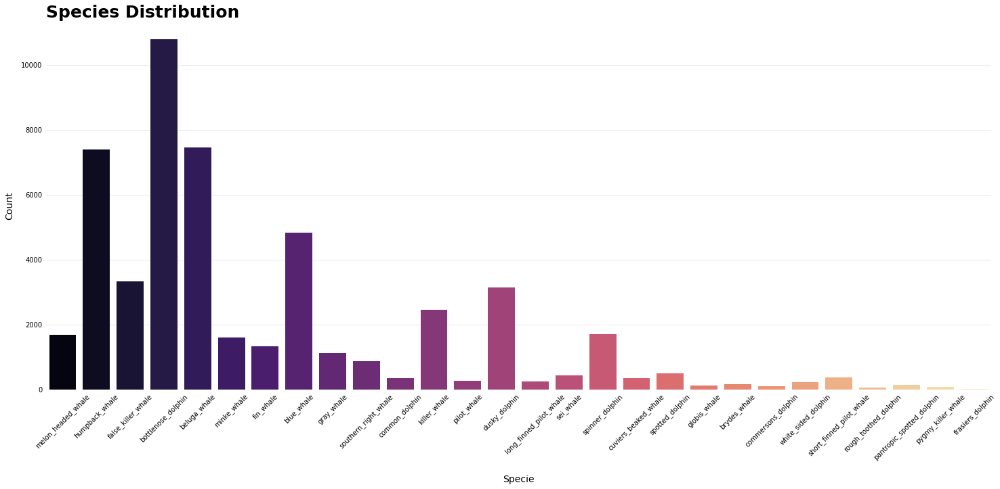

In [13]:
fig = plt.figure(figsize=(25, 10))
fig.set_facecolor("#fff")
ax = fig.add_subplot()
ax.set_facecolor("#fff")
ax.grid(color="lightgrey", alpha=0.7, axis="both", zorder=0)


sns.countplot(x="species", data=df, palette="magma", zorder=2)
plt.xticks(rotation=45)

ax.xaxis.set_tick_params(labelsize=10, size=0, pad=5)
ax.yaxis.set_tick_params(labelsize=10, size=0, pad=5)
ax = hide_spines(ax)

ax.set_ylabel("Count", fontsize=14, labelpad=10)
ax.set_xlabel("Specie", fontsize=14, labelpad=20)

ax.set_title("Species Distribution", loc="left", fontsize=25, fontweight="bold")
fig.show()

In [14]:
def load_image(image_path, channels=cv2.COLOR_BGR2RGB):
    if os.path.exists(image_path):
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, channels)
        image = np.asarray(image)
        return image
    else:
        raise Exception(f"Path : {image_path} doese not exist")

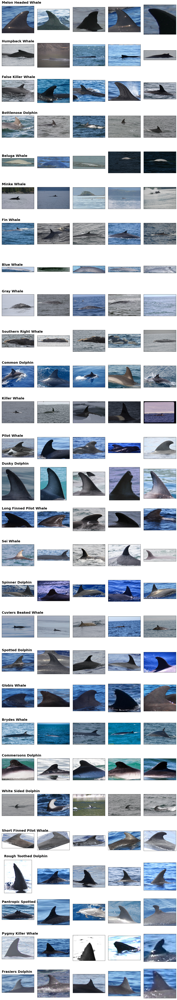

In [15]:
species = df["species"].unique()
n = 5
rows, columns = len(species), n
fig, axes = plt.subplots(len(species), n, figsize=(3*columns, 3*rows))
for i, specie in enumerate(species):
    specie_samples = df[df["species"] == specie][:n]
    specie = specie.replace("_", " ").title()
    for j, (index, sample) in enumerate(specie_samples.iterrows()):
        sample_path = sample["image_path"]
        image = load_image(sample_path)
        
        ax = axes[i, j]
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        ax.imshow(image)
        
        if j == 0:
            ax.set_title(specie, loc="left", y=1.05, fontsize=20, fontweight="bold")
        
fig.tight_layout()
fig.show()        

In [16]:
temp = df.groupby(['class'])['species'].nunique()
temp = pd.DataFrame({'Classes': temp.index,
                   'Species': temp.values
                  })
temp.head()

,Classes,Species
0,dolphin,10
1,whale,18


In [17]:
!pip install imagesize

In [18]:
import imagesize

def get_image_size(file_path):
    width, height = imagesize.get('/kaggle/input/happy-whale-and-dolphin/train_images/' + file_path)
    return [width, height]

In [19]:
# image size using cv2 imread shape
def read_image_sizes_cv2(file_name):
    image = cv2.imread('/kaggle/input/happy-whale-and-dolphin/train_images/' + file_name)
    return list(image.shape)

In [20]:
import time
sample_size = 100
start_time = time.time()
train_sample_df = df.sample(sample_size)
m = np.stack(train_sample_df['image'].apply(read_image_sizes_cv2))
sample_df = pd.DataFrame(m,columns=['w','h','c'])
print(f"Total processing time for {sample_size} images (using cv2): {round(time.time()-start_time, 2)} sec.")

Total processing time for 100 images (using cv2): 6.16 sec.


In [21]:
import time
sample_size = 100
start_time = time.time()
train_sample_df = df.sample(sample_size)
m = np.stack(train_sample_df['image'].apply(get_image_size))#
sample_df = pd.DataFrame(m,columns=['w','h'])
print(f"Total processing time for {sample_size} images (using imagesize): {round(time.time()-start_time, 2)} sec.")

Total processing time for 100 images (using imagesize): 1.0 sec.


In [22]:
#imagesize library is faster
import time
sample_size = 2500
start_time = time.time()
train_sample_df = df.sample(sample_size)
m = np.stack(train_sample_df['image'].apply(get_image_size))#
sample_df = pd.DataFrame(m,columns=['w','h'])
print(f"Total processing time for {sample_size} images (using imagesize): {round(time.time()-start_time, 2)} sec.")

Total processing time for 2500 images (using imagesize): 21.69 sec.


In [23]:
train_img_df = pd.concat([train_sample_df, sample_df], axis=1, sort=False)

In [24]:
print(f"Number of different image size ( images samples): {train_img_df.groupby(['w','h']).count().shape[0]}")

Number of different image size ( images samples): 1389


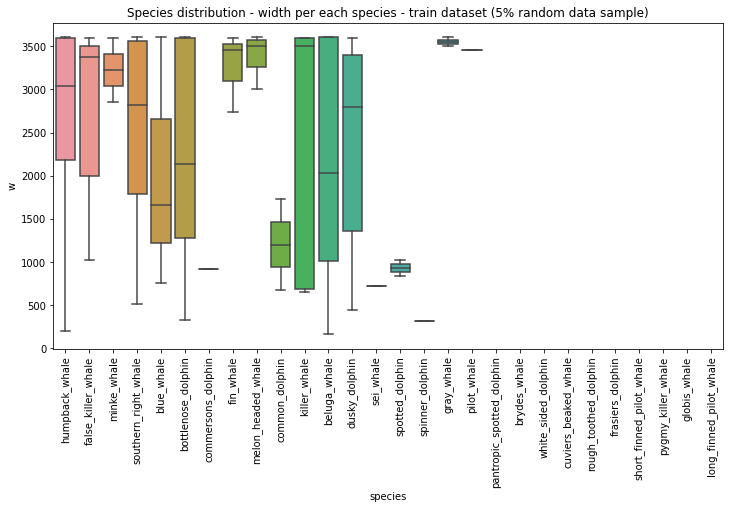

In [25]:
plt.figure(figsize = (12,6))
plt.title('Species distribution - width per each species - train dataset (5% random data sample)')
sns.set_color_codes("pastel")
s = sns.boxplot(x = 'species', y="w", data=train_img_df)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
locs, labels = plt.xticks()
plt.show()

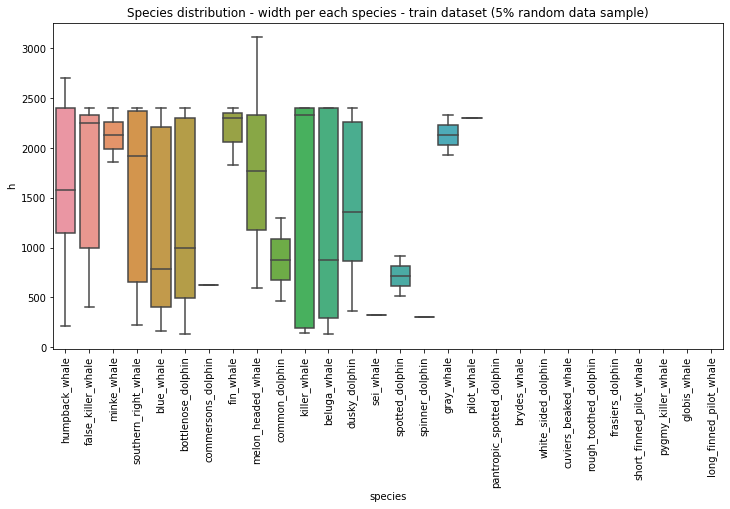

In [26]:
plt.figure(figsize = (12,6))
plt.title('Species distribution - width per each species - train dataset (5% random data sample)')
sns.set_color_codes("pastel")
s = sns.boxplot(x = 'species', y="h", data=train_img_df)
s.set_xticklabels(s.get_xticklabels(),rotation=90)
locs, labels = plt.xticks()
plt.show()

In [27]:
def plot_image_sample(species):
    root_path = '../input/happy-whale-and-dolphin'
    fig.subplots_adjust(hspace=.1, wspace=.1)
    images_folder="train_images/"
    sample_df = df[df['species']==species].copy()
    sample_df.index = range(len(sample_df.index))

    f, ax = plt.subplots(4, 4, figsize=(16,16))
    
    for i in range(16):
        file = sample_df.iloc[i, 'image']
        species = sample_df.iloc[i, 'species']
        identifier = sample_df.iloc[i, 'individual_id']
        img = cv2.imread(root_path+images_folder+file)
        ax[i//4, i%4].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax[i//4, i%4].set_title(identifier+" ("+species+")")
        ax[i//4, i%4].axis('off')

In [28]:
submissions = pd.read_csv('../input/happy-whale-and-dolphin/sample_submission.csv')

In [29]:
submissions.head()

,image,predictions
0,000110707af0ba.jpg,37c7aba965a5 114207cab555 a6e325d8e924 19fbb96...
1,0006287ec424cb.jpg,37c7aba965a5 114207cab555 a6e325d8e924 19fbb96...
2,000809ecb2ccad.jpg,37c7aba965a5 114207cab555 a6e325d8e924 19fbb96...
3,00098d1376dab2.jpg,37c7aba965a5 114207cab555 a6e325d8e924 19fbb96...
4,000b8d89c738bd.jpg,37c7aba965a5 114207cab555 a6e325d8e924 19fbb96...


In [30]:
def rotate_values(x):
    xcopy = x.split()
    temp = xcopy[4]
    xcopy[4] = xcopy[0]
    xcopy[0] = temp
    xcopy = " ".join(xcopy)
    return xcopy

In [31]:
submissions["predictions"] = submissions["predictions"].apply(lambda x: rotate_values(x))

In [32]:
submissions.head()

,image,predictions
0,000110707af0ba.jpg,new_individual 114207cab555 a6e325d8e924 19fbb...
1,0006287ec424cb.jpg,new_individual 114207cab555 a6e325d8e924 19fbb...
2,000809ecb2ccad.jpg,new_individual 114207cab555 a6e325d8e924 19fbb...
3,00098d1376dab2.jpg,new_individual 114207cab555 a6e325d8e924 19fbb...
4,000b8d89c738bd.jpg,new_individual 114207cab555 a6e325d8e924 19fbb...
